Gabriel Ticolat

Yacine Lefebvre-Aladawi

Lisa Desloges

# Data Visualisation

## We welcome you in our notebook 👋


## The goal of this study is to associate each pattern with one of the 12 copyists, thereby determining the typography parameters that contribute most to the identification of each copyist.

## Data Description :

#### The Avila data set has been extracted from 800 images of the the "Avila Bible", a giant Latin copy of the whole Bible produced during the XII century between Italy and Spain.  
#### The palaeographic analysis of the  manuscript has  individuated the presence of 12 copyists. The pages written by each copyist are not equally numerous. 
#### Each pattern contains 10 features and corresponds to a group of 4 consecutive rows.





# Data visualization with Plotly Express





First we import the libraries and load our dataset as df_train

In [164]:
import pandas as pd
import plotly.express as px
from ipywidgets import IntSlider, interact

df_train = pd.read_csv('avila/avila-tr.txt', header=None)


In [165]:
df_train.head() #quick look at the data

,0,1,2,3,4,5,6,7,8,9,10
0,0.266074,-0.165620,0.320980,0.483299,0.172340,0.273364,0.371178,0.929823,0.251173,0.159345,A
1,0.130292,0.870736,-3.210528,0.062493,0.261718,1.436060,1.465940,0.636203,0.282354,0.515587,A
2,-0.116585,0.069915,0.068476,-0.783147,0.261718,0.439463,-0.081827,-0.888236,-0.123005,0.582939,A
3,0.031541,0.297600,-3.210528,-0.583590,-0.721442,-0.307984,0.710932,1.051693,0.594169,-0.533994,A
4,0.229043,0.807926,-0.052442,0.082634,0.261718,0.148790,0.635431,0.051062,0.032902,-0.086652,F


In [166]:
df_train_intCol=df_train.copy() #copy the dataframe cuz we are going to use it later
df_train_intCol

,0,1,2,3,4,5,6,7,8,9,10
0,0.266074,-0.165620,0.320980,0.483299,0.172340,0.273364,0.371178,0.929823,0.251173,0.159345,A
1,0.130292,0.870736,-3.210528,0.062493,0.261718,1.436060,1.465940,0.636203,0.282354,0.515587,A
2,-0.116585,0.069915,0.068476,-0.783147,0.261718,0.439463,-0.081827,-0.888236,-0.123005,0.582939,A
3,0.031541,0.297600,-3.210528,-0.583590,-0.721442,-0.307984,0.710932,1.051693,0.594169,-0.533994,A
4,0.229043,0.807926,-0.052442,0.082634,0.261718,0.148790,0.635431,0.051062,0.032902,-0.086652,F
...,...,...,...,...,...,...,...,...,...,...,...
10425,0.080916,0.588093,0.015130,0.002250,0.261718,-0.557133,0.371178,0.932346,0.282354,-0.580141,F
10426,0.253730,-0.338346,0.352988,-1.154243,0.172340,-0.557133,0.257927,0.348428,0.032902,-0.527134,F
10427,0.229043,-0.000745,0.171611,-0.002793,0.261718,0.688613,0.295677,-1.088486,-0.590727,0.580142,A
10428,-0.301743,0.352558,0.288973,1.638181,0.261718,0.688613,0.069175,0.502761,0.625350,0.718969,E


In [167]:
df_train.columns = ['intercolumnar_distance', 'upper_margin', 'lower_margin', 'exploitation', 'row_number', 'modular_ratio', 'interlinear_spacing', 'weight', 'peak_number', 'modular_ratio_interlinear_spacing', 'class']

In [168]:
df_train #check if the column names are correct


,intercolumnar_distance,upper_margin,lower_margin,exploitation,row_number,modular_ratio,interlinear_spacing,weight,peak_number,modular_ratio_interlinear_spacing,class
0,0.266074,-0.165620,0.320980,0.483299,0.172340,0.273364,0.371178,0.929823,0.251173,0.159345,A
1,0.130292,0.870736,-3.210528,0.062493,0.261718,1.436060,1.465940,0.636203,0.282354,0.515587,A
2,-0.116585,0.069915,0.068476,-0.783147,0.261718,0.439463,-0.081827,-0.888236,-0.123005,0.582939,A
3,0.031541,0.297600,-3.210528,-0.583590,-0.721442,-0.307984,0.710932,1.051693,0.594169,-0.533994,A
4,0.229043,0.807926,-0.052442,0.082634,0.261718,0.148790,0.635431,0.051062,0.032902,-0.086652,F
...,...,...,...,...,...,...,...,...,...,...,...
10425,0.080916,0.588093,0.015130,0.002250,0.261718,-0.557133,0.371178,0.932346,0.282354,-0.580141,F
10426,0.253730,-0.338346,0.352988,-1.154243,0.172340,-0.557133,0.257927,0.348428,0.032902,-0.527134,F
10427,0.229043,-0.000745,0.171611,-0.002793,0.261718,0.688613,0.295677,-1.088486,-0.590727,0.580142,A
10428,-0.301743,0.352558,0.288973,1.638181,0.261718,0.688613,0.069175,0.502761,0.625350,0.718969,E


### Correlation matrix


In [169]:
correlation_matrix = df_train.iloc[:,:10].corr() #we take only the first 9 columns because the last one is the class
fig = px.imshow(correlation_matrix, title='Correlation matrix of the features', color_continuous_scale='RdBu')
fig.update_xaxes(title='Features')
fig.update_yaxes(title='Features')
fig.update_layout(width=700, height=700)
fig.update_traces(showscale=True)
fig.show()

This correlation matrix reveals the relationships between different features. By analyzing this matrix, we can determine the most correlated features, their trends, and potential opportunities for optimization.

From the matrix, we can observe the following features and their correlations, for exemple we can see that the columns 'intercolumnar_distance' and 'weight' have a very strong correlation with other features. It means that if their values increasing or decreasing then the values of the other features will also tend to do the same.

To improve the correlation matrix, it might be worth considering exploring more advanced methods of data preprocessing and analysis. This could include transforming the data to ensure linear relationships, performing dimensionality reduction to focus on the most relevant features, or incorporating more complex machine learning techniques.

Ultimately, this correlation matrix provides valuable insights into the relationships between different features and offers opportunities for further analysis and optimization.

### Matrixes of values comparision between each feature with classes

We put this graph just after the previous one because it gives us a more detailled view

In [170]:
fig = px.scatter_matrix(df_train, color="class",dimensions=['intercolumnar_distance', 'upper_margin', 'lower_margin', 
                                              'exploitation', 'row_number', 'modular_ratio', 
                                              'interlinear_spacing', 'weight', 'peak_number', 
                                              'modular_ratio_interlinear_spacing'],
                                                title='Relations between features and class')

# Affichage du graphique
fig.update_traces(diagonal_visible=False)
fig.update_layout(
    width=1700,
    height=1700,
)
fig.show()

In conclusion, this graph provides a visual representation of various characteristics and relationships among the features of the layout design. It suggests that while some aspects, such as intercolumnar distance and modular ratio, exhibit more even distributions, others, such as upper margin and lower margin, have more concentrated distributions. Also, the peak values of several bars, including exploitation, weight, and interlinear spacing number, indicate the dominant resource use in the avila bible.

### Global visualisation of the patterns by copyists

In [171]:
df_train_parallel=df_train.copy()
df_train_parallel["class"].replace({
    'A': 1, 'B': 2, 'C': 3, 'D': 4, 'E': 5, 'F': 6, 
    'G': 7, 'H': 8, 'I': 9, 'W': 10, 'X': 11, 'Y': 12}, inplace=True)
df_train_parallel #we replace the letters with numbers to be able to plot the parallel coordinates

,intercolumnar_distance,upper_margin,lower_margin,exploitation,row_number,modular_ratio,interlinear_spacing,weight,peak_number,modular_ratio_interlinear_spacing,class
0,0.266074,-0.165620,0.320980,0.483299,0.172340,0.273364,0.371178,0.929823,0.251173,0.159345,1
1,0.130292,0.870736,-3.210528,0.062493,0.261718,1.436060,1.465940,0.636203,0.282354,0.515587,1
2,-0.116585,0.069915,0.068476,-0.783147,0.261718,0.439463,-0.081827,-0.888236,-0.123005,0.582939,1
3,0.031541,0.297600,-3.210528,-0.583590,-0.721442,-0.307984,0.710932,1.051693,0.594169,-0.533994,1
4,0.229043,0.807926,-0.052442,0.082634,0.261718,0.148790,0.635431,0.051062,0.032902,-0.086652,6
...,...,...,...,...,...,...,...,...,...,...,...
10425,0.080916,0.588093,0.015130,0.002250,0.261718,-0.557133,0.371178,0.932346,0.282354,-0.580141,6
10426,0.253730,-0.338346,0.352988,-1.154243,0.172340,-0.557133,0.257927,0.348428,0.032902,-0.527134,6
10427,0.229043,-0.000745,0.171611,-0.002793,0.261718,0.688613,0.295677,-1.088486,-0.590727,0.580142,1
10428,-0.301743,0.352558,0.288973,1.638181,0.261718,0.688613,0.069175,0.502761,0.625350,0.718969,5


In [172]:
fig_dynamic = px.parallel_coordinates(df_train_parallel, color="class", color_continuous_midpoint=2, color_continuous_scale=px.colors.diverging.Tealrose, dimensions=['intercolumnar_distance', 'upper_margin', 'lower_margin', 'exploitation', 'row_number', 'modular_ratio', 'interlinear_spacing', 'weight', 'peak_number', 'modular_ratio_interlinear_spacing'],range_color=[1,12])
fig_dynamic.update_layout(width=1200, height=900)
fig_dynamic.show()

 By comparing the values of these variables for different typography designs (features), it gives a deeper understanding of the factors that contribute to the overall quality and readability of the text, helping in determining the copyist in the Avila Bible.
 

In [173]:
#df_train

### Distribution of features per classes

In [174]:
dfs = df_train.melt(id_vars='class', var_name='category', value_name='values')
# Create histogram that shows the distribution of the values of each attribute per class
fig = px.histogram(dfs, x='category', color='category', animation_frame='class', y='values',
                    title='Distribution of the values of each feature per class',range_y=[0,1200])
fig.update_layout(
    bargap=0.1, 
    bargroupgap=0.1,  
)
fig.show()


In this visualization, the histogram represents the distribution of the values of each attribute (represented by 'category') per class (represented by 'class'). With this graph you can gain insights into the usage patterns of different categories within each class and across all classes.

### Analysis of symetrie of the features in the dataset

In [175]:
df_train.set_index('class', inplace=True)
df_train.head()

,intercolumnar_distance,upper_margin,lower_margin,exploitation,row_number,modular_ratio,interlinear_spacing,weight,peak_number,modular_ratio_interlinear_spacing
class,,,,,,,,,,
A,0.266074,-0.165620,0.320980,0.483299,0.172340,0.273364,0.371178,0.929823,0.251173,0.159345
A,0.130292,0.870736,-3.210528,0.062493,0.261718,1.436060,1.465940,0.636203,0.282354,0.515587
A,-0.116585,0.069915,0.068476,-0.783147,0.261718,0.439463,-0.081827,-0.888236,-0.123005,0.582939
A,0.031541,0.297600,-3.210528,-0.583590,-0.721442,-0.307984,0.710932,1.051693,0.594169,-0.533994
F,0.229043,0.807926,-0.052442,0.082634,0.261718,0.148790,0.635431,0.051062,0.032902,-0.086652


In [176]:
dfs = df_train.stack().reset_index()
dfs.columns = ['class', 'category', 'values']
dfs.head()

,class,category,values
0,A,intercolumnar_distance,0.266074
1,A,upper_margin,-0.165620
2,A,lower_margin,0.320980
3,A,exploitation,0.483299
4,A,row_number,0.172340


In [177]:
fig = px.box(dfs, x='category', y='values', color='category', animation_frame='class', title='Distribution of the values of each feature per class', range_y=[-4, 3])
fig.update_layout(
    bargap=0.1, 
    bargroupgap=0.1,  
)
fig.show()


You can observe the distribution of the values for each attribute across different classes. This will help understanding if there are any notable patterns or inconsistencies in the data.

 If the distribution of the values for a particular faeture is similar across all classes, this might suggest that the feature is not particularly useful for distinguishing between classes.
 
 We can also look for potential outliers or anomalies in the data by observing the distribution of the values for each feature across different classes. These could be potential errors or inconsistencies in the data that might need to take into account.

# Data visualization with SeaBorn

In [178]:
import seaborn as sns
import matplotlib.pyplot as plt
import ipywidgets as widgets
from ipywidgets import interact
df_train_sns = pd.read_csv('avila/avila-tr.txt', header=None)
df_train_sns.columns = ['intercolumnar_distance', 'upper_margin', 'lower_margin', 'exploitation', 'row_number', 'modular_ratio', 'interlinear_spacing', 'weight', 'peak_number', 'modular_ratio_interlinear_spacing', 'class']

In [179]:
df_train_sns

,intercolumnar_distance,upper_margin,lower_margin,exploitation,row_number,modular_ratio,interlinear_spacing,weight,peak_number,modular_ratio_interlinear_spacing,class
0,0.266074,-0.165620,0.320980,0.483299,0.172340,0.273364,0.371178,0.929823,0.251173,0.159345,A
1,0.130292,0.870736,-3.210528,0.062493,0.261718,1.436060,1.465940,0.636203,0.282354,0.515587,A
2,-0.116585,0.069915,0.068476,-0.783147,0.261718,0.439463,-0.081827,-0.888236,-0.123005,0.582939,A
3,0.031541,0.297600,-3.210528,-0.583590,-0.721442,-0.307984,0.710932,1.051693,0.594169,-0.533994,A
4,0.229043,0.807926,-0.052442,0.082634,0.261718,0.148790,0.635431,0.051062,0.032902,-0.086652,F
...,...,...,...,...,...,...,...,...,...,...,...
10425,0.080916,0.588093,0.015130,0.002250,0.261718,-0.557133,0.371178,0.932346,0.282354,-0.580141,F
10426,0.253730,-0.338346,0.352988,-1.154243,0.172340,-0.557133,0.257927,0.348428,0.032902,-0.527134,F
10427,0.229043,-0.000745,0.171611,-0.002793,0.261718,0.688613,0.295677,-1.088486,-0.590727,0.580142,A
10428,-0.301743,0.352558,0.288973,1.638181,0.261718,0.688613,0.069175,0.502761,0.625350,0.718969,E


### Mean distribution of feature's values per copyist's

In [184]:
@interact
def barplot_by_feature(selected_feature=df_train_sns.columns):
    plt.figure(figsize=(10, 6))
    sns.barplot(y=df_train_sns[selected_feature], x=df_train_sns["class"], errorbar=None)
    plt.title(f'Mean distribution of feature\'s values of {selected_feature} per copyist\'s  ')
    plt.xlabel('Copyist')

interactive(children=(Dropdown(description='selected_feature', options=('intercolumnar_distance', 'upper_margi…

The graph represents the distribution of every feature for each copyist's in a set. Each copyist has its own values for this feature. You can check the values with the next graph.
please be carreful this graph only indicates the mean value (for ex : for the feature intercolumnar_distance the mean value is of W is -1.5, it's not a range of data). This graph helps us to understand the next one which is very dense and harder to see all data. It gives us a first view of the values distrivution per feature and per copyist.

### Distribution of features per classe

In [181]:
@interact
def plot_histogram(feature=df_train_sns.columns[:-1]): #we don't want to plot the class
    plt.figure(figsize=(10 ,8))
    sns.histplot(data=df_train_sns, x=feature, hue='class',multiple="stack", palette="tab10", kde=True,)
    plt.title(f'Distribution of {feature} per classes')
    plt.xlim(-5, 10)
    plt.xlabel(feature)
    plt.ylabel('Count')

    plt.show()

interactive(children=(Dropdown(description='feature', options=('intercolumnar_distance', 'upper_margin', 'lowe…

This graph provides insights into the distribution of copyist across different features. The feature's values for each class can help identify patterns in the stylistic analysis attribution. The x axis is for the values of the selected feature and y axis is to count how many time we accounter this value for this feature by copyist.

### Density of the features values in df_train (values < 25)

c:\Users\YLA\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\Users\YLA\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\Users\YLA\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\Users\YLA\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\Users\YLA\AppData\Local\Programs\Python\Pytho

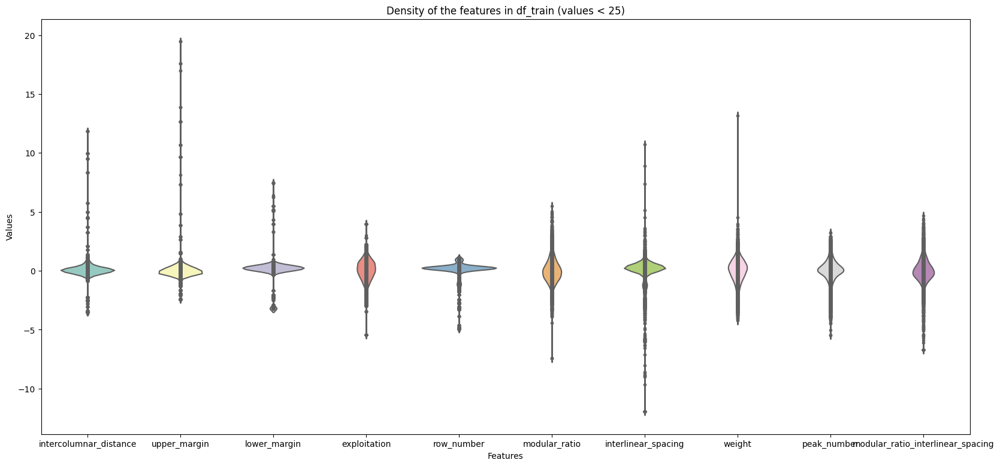

In [182]:
df_train_violin =df_train_sns.copy()
df_train_violin = df_train_violin.drop(columns=["class"])

# Filter the DataFrame by 'df_train_intCol' < 25
filtered_data = df_train_violin[df_train_violin < 25]

# Create the violin plot
plt.figure(figsize=(20, 9))
sns.violinplot(filtered_data, inner="points", palette="Set3")
plt.title('Density of the features in df_train (values < 25)')
plt.xlabel('Features')
plt.ylabel('Values')

plt.show()

In addition to the other graphs, we found interesting to look just at the density of the values of the feature in the dataset. We can easily tell with this graphs for each feature what are the ranges where we will find the most values. Also we can see all the outliers and other amounts of data values like for lower_margin. 

### Distribution of copyist in the dataset

c:\Users\YLA\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\Users\YLA\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\Users\YLA\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



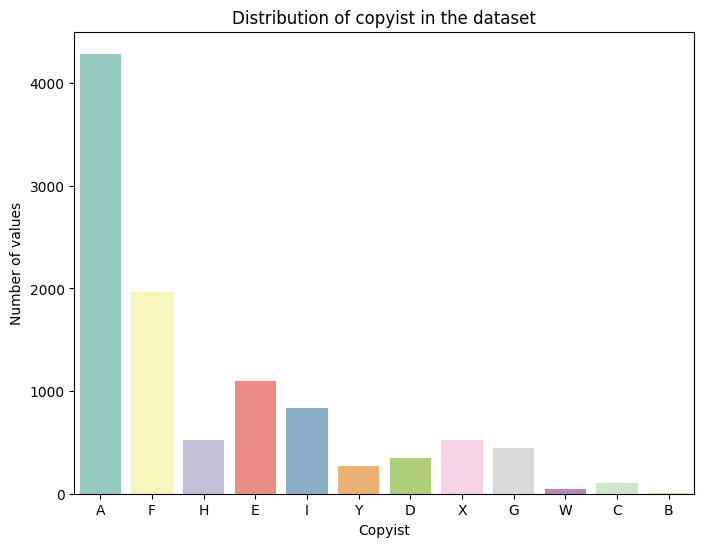

In [183]:
plt.figure(figsize=(8, 6))
sns.countplot(x=df_train_sns['class'], palette='Set3')
plt.title('Distribution of copyist in the dataset')
plt.xlabel('Copyist')
plt.ylabel('Number of values')
plt.show()

Finally a simple graph to understand the distribution of the classes in the dataset. It is clear that the dataset is not balanced. The class A is the mostpresent in the dataset and the class B is the least present.